## Import das bibliotecas utilizadas


In [62]:
import pandas as pd
import numpy as np
import warnings
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from statistics import multimode
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.stattools import pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tools.sm_exceptions import InterpolationWarning



### Carrega Arquivo para EDA complementar

In [38]:
df_transpose_copy_graph = pd.read_csv(r'Projeto/Data/Output/df_transposed_copy_inputting_v19.csv')
df_transpose_copy_graph.head(5)

,year,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
0,1980-01-01,4.345486,2.7,-5.4,2.877381,2.4,8.2,0.7,5.290000,5.399885,...,-0.8,3.3,3.988678,1.8,6.4,0.9,-1.9,3.8,3.991920,2.1
1,1981-01-01,7.200000,5.7,3.0,0.385714,-4.4,3.8,-5.7,3.798462,-3.624698,...,-0.5,1.9,1.792949,0.1,0.9,2.0,-0.2,4.2,4.567689,1.9
2,1982-01-01,5.116667,2.9,6.4,0.371429,0.0,-0.1,-3.1,2.306923,4.538833,...,1.4,1.5,5.395555,0.6,-0.5,-0.1,0.4,2.2,8.037341,0.7
3,1983-01-01,4.283333,1.1,5.4,1.471429,4.2,5.4,3.7,0.815385,1.930603,...,4.6,1.8,4.752000,1.7,-2.8,3.3,0.7,4.0,3.300508,2.6
4,1984-01-01,6.166667,2.0,5.6,2.585714,6.0,10.2,2.0,-0.676154,-15.680825,...,4.1,4.1,-0.599934,2.5,3.9,5.0,0.3,6.6,5.023940,4.6


In [39]:
df_transpose_copy_graph['year'] = pd.to_datetime(df_transpose_copy_graph['year'], format='ISO8601')


In [40]:
df_transpose_copy_graph.set_index('year', inplace = True)
df_transpose_copy_graph.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 49 entries, 1980-01-01 to 2028-01-01
Columns: 228 entries, Afghanistan to World
dtypes: float64(228)
memory usage: 87.7 KB


In [41]:
df_transpose_copy_graph.head(5)

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
year,,,,,,,,,,,,,,,,,,,,,
1980-01-01,4.345486,2.7,-5.4,2.877381,2.4,8.2,0.7,5.290000,5.399885,2.9,...,-0.8,3.3,3.988678,1.8,6.4,0.9,-1.9,3.8,3.991920,2.1
1981-01-01,7.200000,5.7,3.0,0.385714,-4.4,3.8,-5.7,3.798462,-3.624698,4.1,...,-0.5,1.9,1.792949,0.1,0.9,2.0,-0.2,4.2,4.567689,1.9
1982-01-01,5.116667,2.9,6.4,0.371429,0.0,-0.1,-3.1,2.306923,4.538833,0.1,...,1.4,1.5,5.395555,0.6,-0.5,-0.1,0.4,2.2,8.037341,0.7
1983-01-01,4.283333,1.1,5.4,1.471429,4.2,5.4,3.7,0.815385,1.930603,-0.5,...,4.6,1.8,4.752000,1.7,-2.8,3.3,0.7,4.0,3.300508,2.6
1984-01-01,6.166667,2.0,5.6,2.585714,6.0,10.2,2.0,-0.676154,-15.680825,6.3,...,4.1,4.1,-0.599934,2.5,3.9,5.0,0.3,6.6,5.023940,4.6


### Gerando grupo para análises

In [53]:
# Define the groups of countries
groups = {
    "advanced_economies" : ["Andorra","Aruba","Australia","Austria","Bahrain","Belgium","Canada","Cyprus","Czech Republic","Denmark","Estonia","Finland","France","Germany","Greece","Hong Kong SAR","Iceland","Ireland","Israel","Italy","Japan","Republic of Korea","Kuwait","Latvia","Lithuania","Luxembourg","Macao SAR","Malta","Netherlands","New Zealand","Norway","Oman","Portugal","Puerto Rico","Qatar","San Marino","Singapore","Slovak Republic","Slovenia","Spain","Sweden","Switzerland","Taiwan Province of China","United Arab Emirates","United Kingdom","United States"],
    "emerging_and_developing_europe" : ["Bulgaria","Croatia","Hungary","Poland","Romania","Russian Federation","Republic of Turkiye","Ukraine"],
    "asean_5" : ["Indonesia","Malaysia","Philippines","Singapore","Thailand"],
    "sub_saharan_africa" : ["Angola","Benin","Botswana","Burkina Faso","Burundi","Cabo Verde","Cameroon","Central African Republic","Chad","Comoros","Dem. Rep. of the Congo","Republic of Congo","Côte d'Ivoire","Djibouti","Equatorial Guinea","Eritrea","Eswatini","Ethiopia","Gabon","The Gambia","Ghana","Guinea","Guinea-Bissau","Kenya","Lesotho","Liberia","Madagascar","Malawi","Mali","Mauritania","Mauritius","Mozambique","Namibia","Niger","Nigeria","Rwanda","São Tomé and Príncipe","Senegal","Seychelles","Sierra Leone","Somalia","South Africa","Republic of South Sudan","Sudan","Tanzania","Togo","Uganda","Zambia","Zimbabwe"],
    "north_africa" : ["Algeria","Egypt","Libya","Morocco","Sudan","Tunisia"],
    "africa" : ["Algeria","Egypt","Libya","Morocco","Sudan","Tunisia","Angola","Benin","Botswana","Burkina Faso","Burundi","Cabo Verde","Cameroon","Central African Republic","Chad","Comoros","Dem. Rep. of the Congo","Republic of Congo","Côte d'Ivoire","Djibouti","Equatorial Guinea","Eritrea","Eswatini","Ethiopia","Gabon","The Gambia","Ghana","Guinea","Guinea-Bissau","Kenya","Lesotho","Liberia","Madagascar","Malawi","Mali","Mauritania","Mauritius","Mozambique","Namibia","Niger","Nigeria","Rwanda","São Tomé and Príncipe","Senegal","Seychelles","Sierra Leone","Somalia","South Africa","Republic of South Sudan","Sudan","Tanzania","Togo","Uganda","Zambia","Zimbabwe"],
    "euro_area": ["Austria","Belgium","Cyprus","Estonia","Finland","France","Germany","Greece","Ireland","Italy","Latvia","Lithuania","Luxembourg","Malta","Netherlands","Portugal","Slovak Republic","Slovenia","Spain"],
    "european_union": ["Austria","Belgium","Bulgaria","Croatia","Cyprus","Czech Republic","Denmark","Estonia","Finland","France","Germany","Greece","Hungary","Ireland","Italy","Latvia","Lithuania","Luxembourg","Malta","Netherlands","Poland","Portugal","Romania","Slovak Republic","Slovenia","Spain","Sweden"],
    "europe": ["Albania","Andorra","Armenia","Austria","Azerbaijan","Belarus","Belgium","Bosnia and Herzegovina","Bulgaria","Croatia","Cyprus","Czech Republic","Denmark","Estonia","Finland","France","Georgia","Germany","Greece","Hungary","Iceland","Ireland","Italy","Kazakhstan","Kosovo","Latvia","Lithuania","Luxembourg","Malta","Moldova","Montenegro","Netherlands","North Macedonia","Norway","Poland","Portugal","Romania","Russian Federation","San Marino","Serbia","Slovak Republic","Slovenia","Spain","Sweden","Switzerland","Republic of Turkiye","Ukraine","United Kingdom"],
    "western_europe": ["Andorra","Austria","Belgium","France","Germany","Luxembourg","Netherlands","Switzerland"],
    "emerging_and_developing_asia": ["Bangladesh","China","India","Indonesia","Iran","Jordan","Lebanon","Malaysia","Pakistan","Philippines","Sri Lanka","Thailand","Republic of Turkiye","Vietnam"],
    "middle_east": ["Bahrain","Iran","Iraq","Israel","Jordan","Kuwait","Lebanon","Oman","Qatar","Saudi Arabia","Syria","United Arab Emirates","Yemen"],
    "southeast_asia": ["Brunei Darussalam","Cambodia","Indonesia","Lao P.D.R.","Malaysia","Myanmar","Philippines","Singapore","Thailand","Timor-Leste","Vietnam"],
    "south_asia": ["Afghanistan","Bangladesh","Bhutan","India","Nepal","Pakistan","Sri Lanka"],
    "east_asia": ["China","Japan","Republic of Korea","Taiwan Province of China"],
    "pacific_islands": ["Fiji","Kiribati","Marshall Islands","Fed. States of Micronesia","Nauru","Palau","Papua New Guinea","Solomon Islands","Tonga","Tuvalu","Vanuatu"],
    "australia_and_new_zealand": ["Australia","New Zealand"],
    "western_hemisphere": ["Argentina","The Bahamas","Barbados","Belize","Bolivia","Brazil","Canada","Chile","Colombia","Costa Rica","Dominica","Dominican Republic","Ecuador","El Salvador","Grenada","Guatemala","Guyana","Haiti","Honduras","Jamaica","Mexico","Nicaragua","Panama","Paraguay","Peru","Saint Kitts and Nevis","Saint Lucia","Saint Vincent and the Grenadines","Suriname","Trinidad and Tobago","United States","Uruguay","Venezuela"],
    "south_america": ["Antigua and Barbuda","Argentina","Bolivia","Brazil","Chile","Colombia","Ecuador","Guyana","Paraguay","Peru","Suriname","Uruguay","Venezuela"],
    "north_america": ["Canada","United States"],
    "central_america": ["Belize","Costa Rica","El Salvador","Guatemala","Honduras","Nicaragua","Panama"],
    "caribbean": ["Antigua and Barbuda","The Bahamas","Barbados","Dominica","Dominican Republic","Grenada","Haiti","Jamaica","Saint Kitts and Nevis","Saint Lucia","Saint Vincent and the Grenadines","Trinidad and Tobago"],
    "asia_and_pacific": ["Afghanistan","Bangladesh","Bhutan","Brunei Darussalam","Cambodia","China","Fiji","India","Indonesia","Iran","Japan","Kazakhstan","Kiribati","Kyrgyz Republic","Lao P.D.R.","Malaysia","Maldives","Marshall Islands","Fed. States of Micronesia","Mongolia","Myanmar","Nauru","Nepal","New Zealand","Pakistan","Palau","Papua New Guinea","Philippines","Samoa","Singapore","Solomon Islands","Republic of Korea","Sri Lanka","Taiwan Province of China","Tajikistan","Thailand","Timor-Leste","Tonga","Turkmenistan","Tuvalu","Uzbekistan","Vanuatu","Vietnam","Belize","Costa Rica","El Salvador","Guatemala","Honduras","Nicaragua","Panama"],
    "middle_east_and_central_asia": ["Afghanistan","Armenia","Azerbaijan","Bahrain","Iran","Iraq","Israel","Jordan","Kazakhstan","Kuwait","Kyrgyz Republic","Lebanon","Oman","Pakistan","Qatar","Saudi Arabia","Syria","Tajikistan","Turkmenistan","United Arab Emirates","Uzbekistan","Yemen"],
    "central_asia_and_the_caucasus": ["Armenia","Azerbaijan","Georgia","Kazakhstan","Kyrgyz Republic","Tajikistan","Turkmenistan","Uzbekistan"],
    "latin_america_and_the_caribbean": ["Antigua and Barbuda","Argentina","The Bahamas","Barbados","Belize","Bolivia","Brazil","Chile","Colombia","Costa Rica","Dominica","Dominican Republic","Ecuador","El Salvador","Grenada","Guatemala","Guyana","Haiti","Honduras","Jamaica","Mexico","Nicaragua","Panama","Paraguay","Peru","Saint Kitts and Nevis","Saint Lucia","Saint Vincent and the Grenadines","Suriname","Trinidad and Tobago","Uruguay","Venezuela"],
    "soviet_union_countries" : ["Armenia","Azerbaijan","Belarus","Estonia","Georgia","Kazakhstan","Kyrgyz Republic", "Latvia","Lithuania","Moldova","Russian Federation", "Tajikistan", "Turkmenistan","Ukraine","Uzbekistan"],
    "neighboring_west_bank_and_gaza": ["Israel", "Jordan","Egypt", "West Bank and Gaza"],

}

In [42]:
groups3 = {
    "africa": ["Africa (Region)"],
    "asia_and_pacific": ["Asia and Pacific"],
    "australia_nz": ["Australia and New Zealand"],
    "caribbean": ["Caribbean"],
    "central_america": ["Central America"],
    "central_asia_caucasus": ["Central Asia and the Caucasus"],
    "east_asia": ["East Asia"],
    "eastern_europe": ["Eastern Europe "],
    "europe": ["Europe"],
    "middle_east": ["Middle East (Region)"],
    "north_africa": ["North Africa"],
    "north_america": ["North America"],
    "pacific_islands": ["Pacific Islands "],
    "south_america": ["South America"],
    "south_asia": ["South Asia"],
    "southeast_asia": ["Southeast Asia"],
    "subsaharan_africa_region": ["Sub-Saharan Africa (Region) "],
    "western_europe": ["Western Europe"],
    "western_hemisphere": ["Western Hemisphere (Region)"],
    "asean_5": ["ASEAN-5"],
    "advanced_economies": ["Advanced economies"],
    "emerging_and_developing_asia": ["Emerging and Developing Asia"],
    "emerging_and_developing_europe": ["Emerging and Developing Europe"],
    "emerging_market_and_developing_economies": ["Emerging market and developing economies"],
    "euro_area": ["Euro area"],
    "european_union": ["European Union"],
    "latin_america_and_the_caribbean": ["Latin America and the Caribbean"],
    "major_advanced_economies_(g7)": ["Major advanced economies (G7)"],
    "middle_east_and_central_asia": ["Middle East and Central Asia"],
    "other_advanced_economies": ["Other advanced economies"],
    "sub-saharan_africa": ["Sub-Saharan Africa"],
    "world": ["World"]
}


### Gerando os graficos temporais dos grupos

#### Ver gráficos de todos os grupos após inputação dos dados

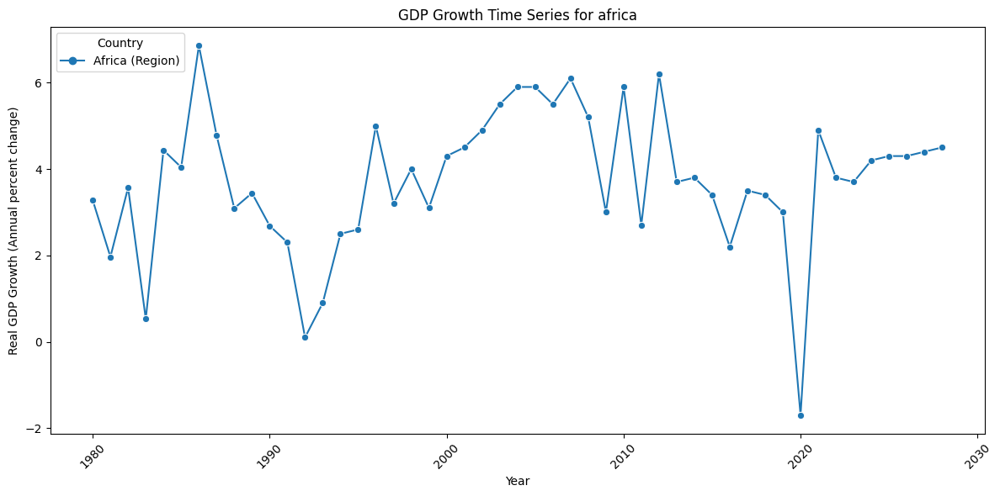

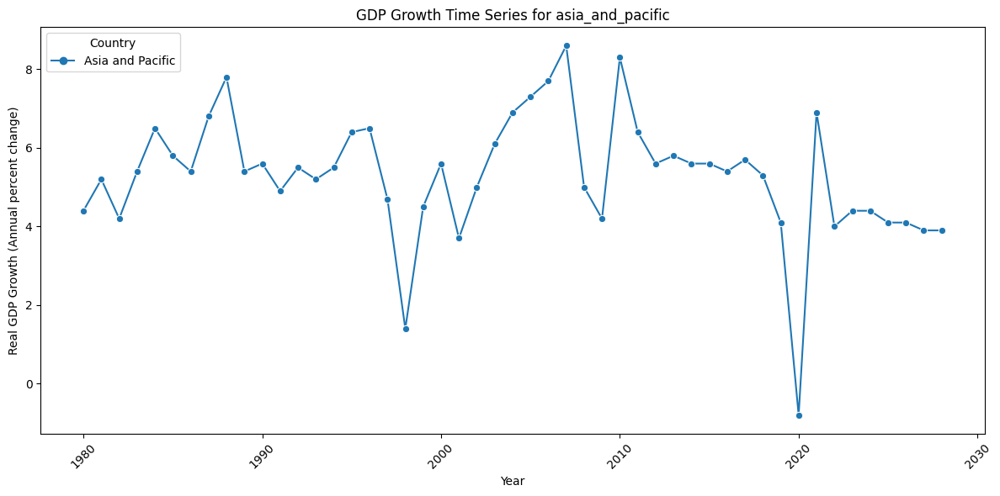

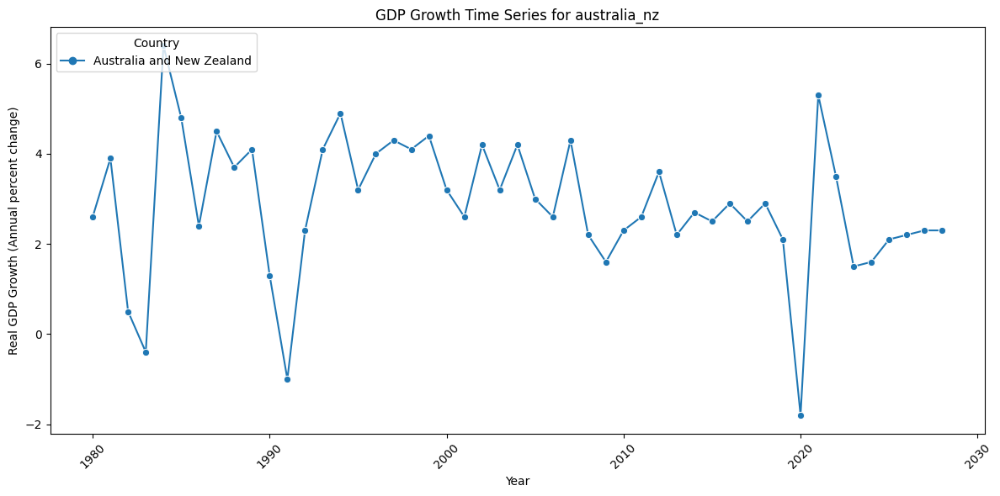

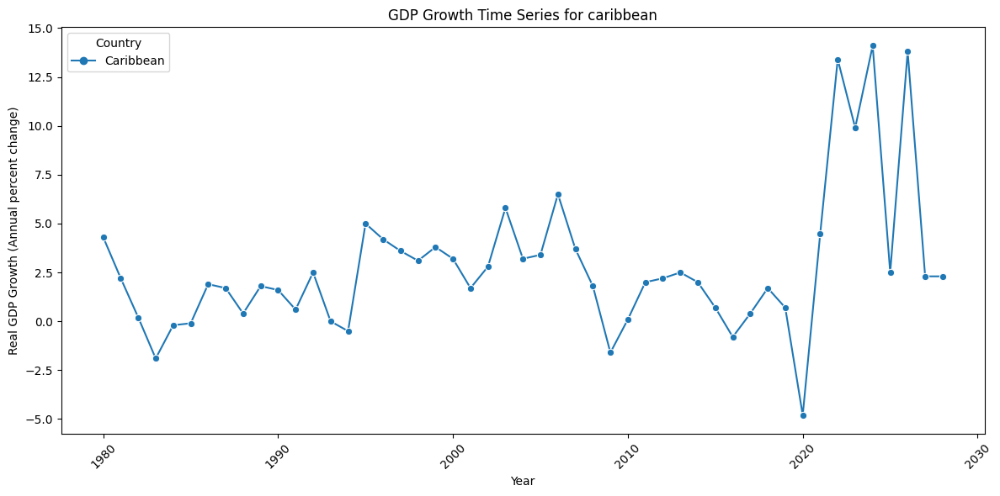

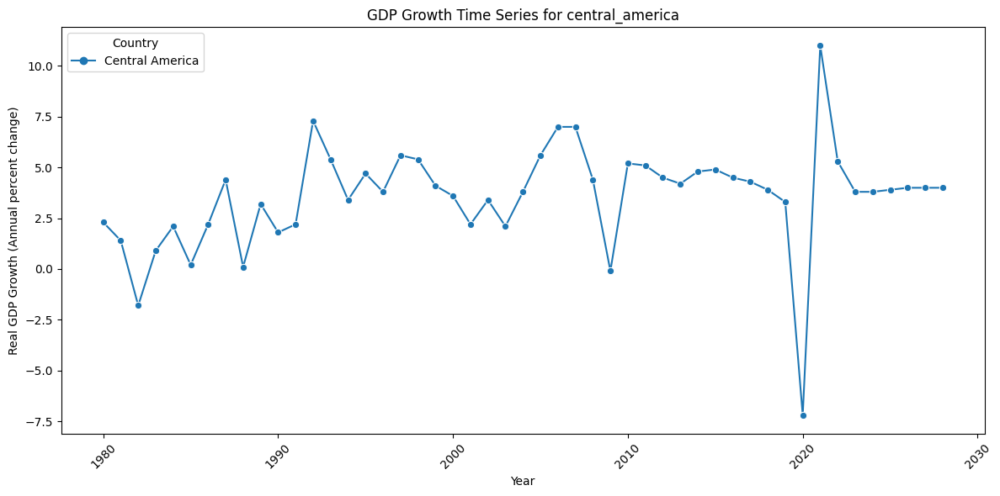

...

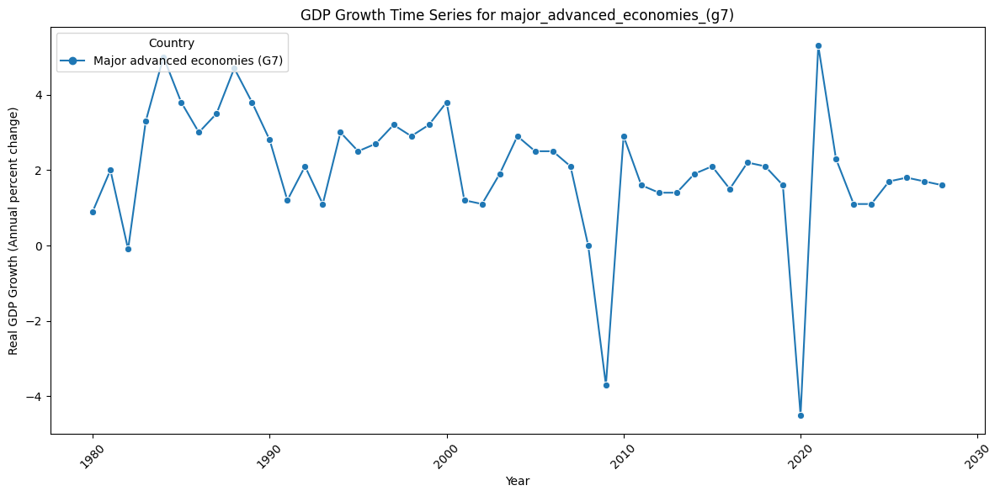

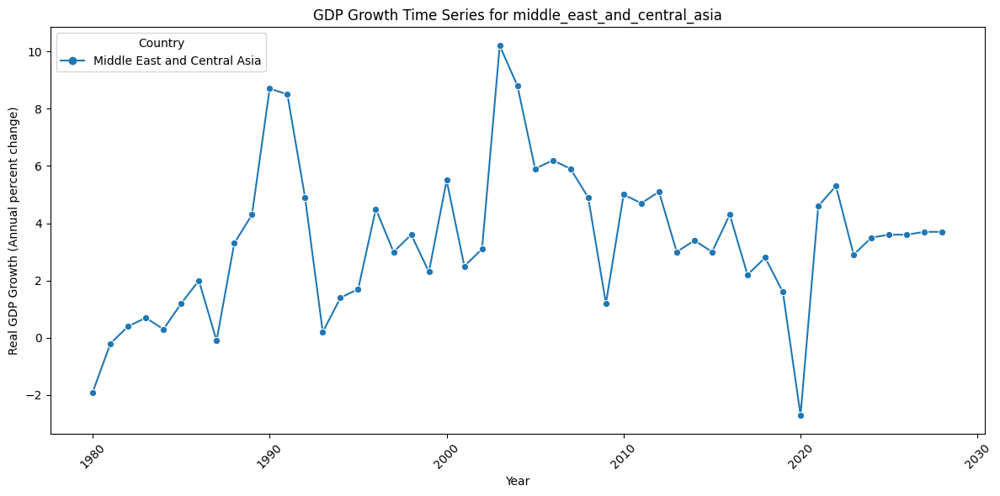

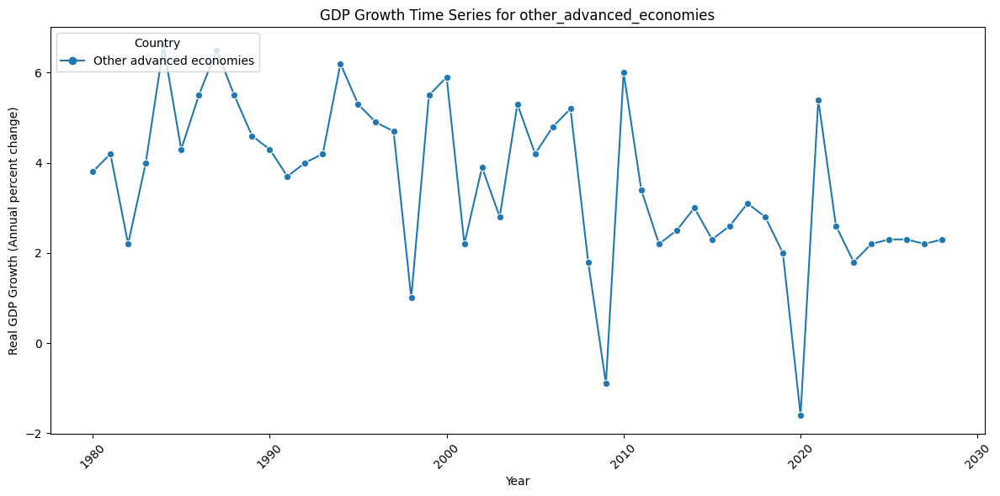

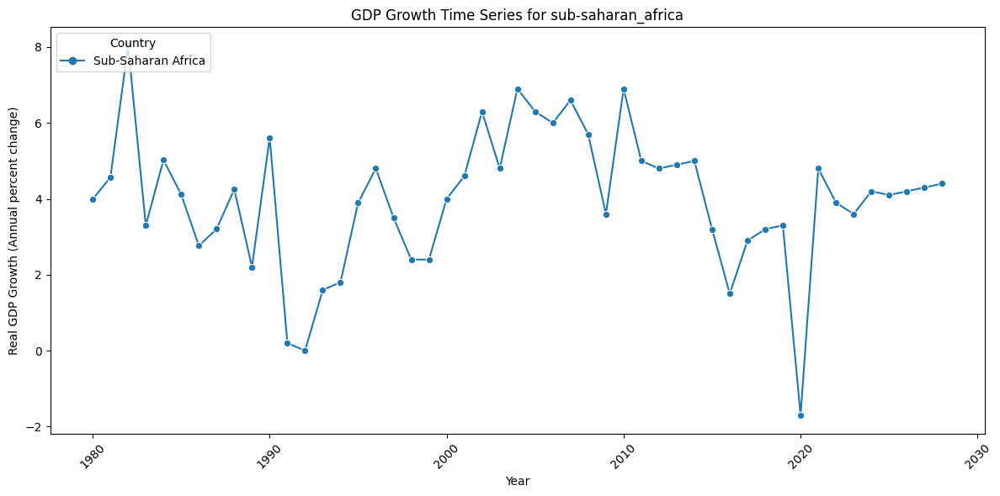

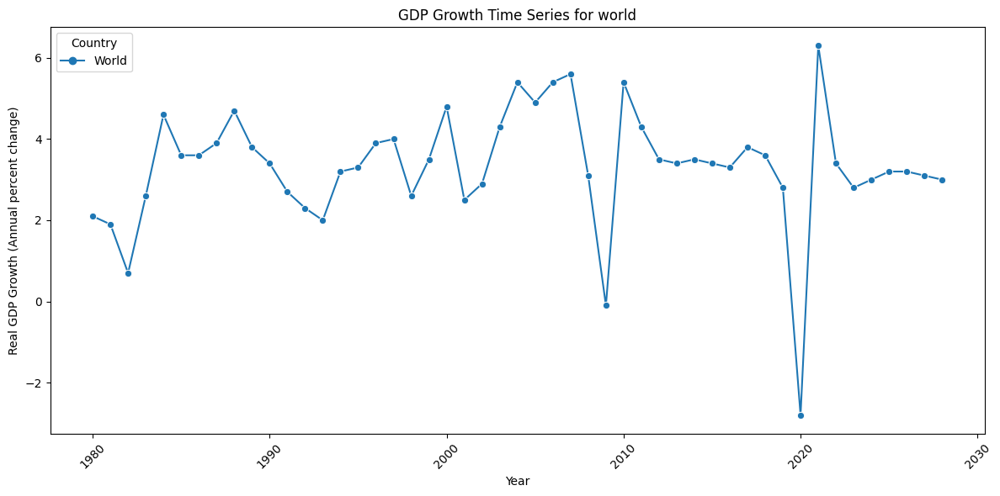

In [63]:

# Loop through the groups and plot the data
for group_name, country_list in groups3.items():
    # Filter the DataFrame to include only the selected countries
    group_data = df_transpose_copy_graph[country_list]

    # Plot the time series using Seaborn
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=group_data, markers=True)
    plt.title(f"GDP Growth Time Series for {group_name}")
    plt.xlabel("Year")
    plt.ylabel("Real GDP Growth (Annual percent change)")

    plt.xticks(rotation=45)
    plt.tight_layout()

    plt.legend(loc='upper left', title="Country")
    plt.show()


### EDA complementar - Decomposição da Série Temporal

#### Aplicando o método .decompose()

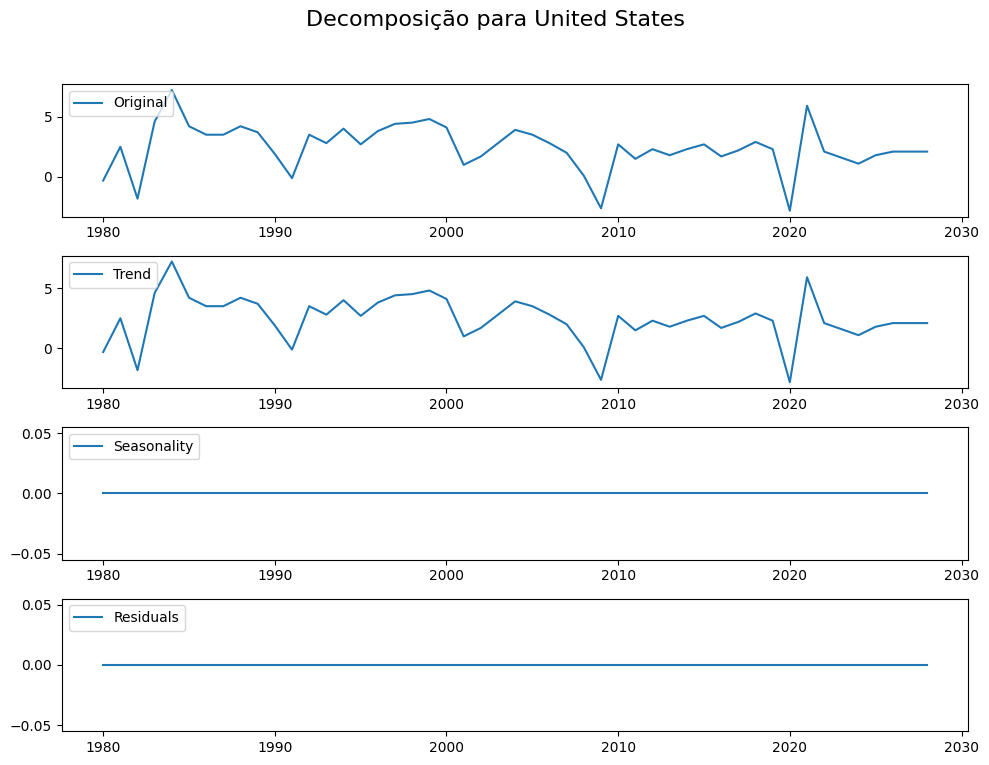

In [64]:


country_name = "United States"  

plt.figure(figsize=(10, 8))
plt.suptitle(f'Decomposição para {country_name}', fontsize=16)

country_series = df_transpose_copy_decompose[country_name]  # select region country column

decomposition = seasonal_decompose(country_series, model='additive')
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

plt.subplot(4, 1, 1)
plt.plot(country_series.index, country_series, label='Original')
plt.legend(loc='upper left')

plt.subplot(4, 1, 2)
plt.plot(country_series.index, trend, label='Trend')
plt.legend(loc='upper left')

plt.subplot(4, 1, 3)
plt.plot(country_series.index, seasonal, label='Seasonality')
plt.legend(loc='upper left')

plt.subplot(4, 1, 4)
plt.plot(country_series.index, residual, label='Residuals')
plt.legend(loc='upper left')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  #Adjust title space
plt.show()


Os gráficos de tendência e sazonalidade mostraram uma linha reta no eixo zero quando se escolhe 1 como período. Isso sugere que o período escolhido é muito curto para capturar qualquer padrão sazonal significativo, dessa maneira a decomposição sazonal assume que não há padrão de sazonalidade e tenta dividir os dados apenas em tendência e resíduo.  

- Tendência: Similar ou igual ao gráfico original indica pouca ou nenhuma tendência.
- Sazonalidade: A linha reta no eixo zero sugere que não existem padrões sazonais evidentes na série temporal, não exibindo variações regulares que se repetem em intervalos fixos como sazonalidade mensal ou anual. 
- Residuals: Linha reta em zero indica que os dados originais não possuem variação aleatória significativa após a remoção da tendência e da sazonalidade.

A ideia chave é que se não existir algum padrão, modelos de forecasting não deveriam ser utilizados.

Como os dados tratam a respeito de GDP (PIB), o período de 1 ano pode, realmente, não ser o mais apropriado para a análise. Como trata-se de dados econômicos de crescimento do PIB de países e grupos de países as variáveis que interferem nas questões econômicas podem depender caso a caso.
Como se investiga a ocorrência de sazonalidade e trend para os dados de GDP, foi escolhido como período para uma decomposição sazonal o valor 4, uma vez que nossos dados são anuais e, no geral, o ciclo político de um país é de 4 anos, sendo este o fator escolhido para realizar a investigação. 

In [44]:
df_transpose_copy_decompose = df_transpose_copy_graph.copy()


#### Decomposição sazonal para país individual

Como exemplo foi escolhido o país Estados Unidos, pois ele foi palco da recessão de 2008.

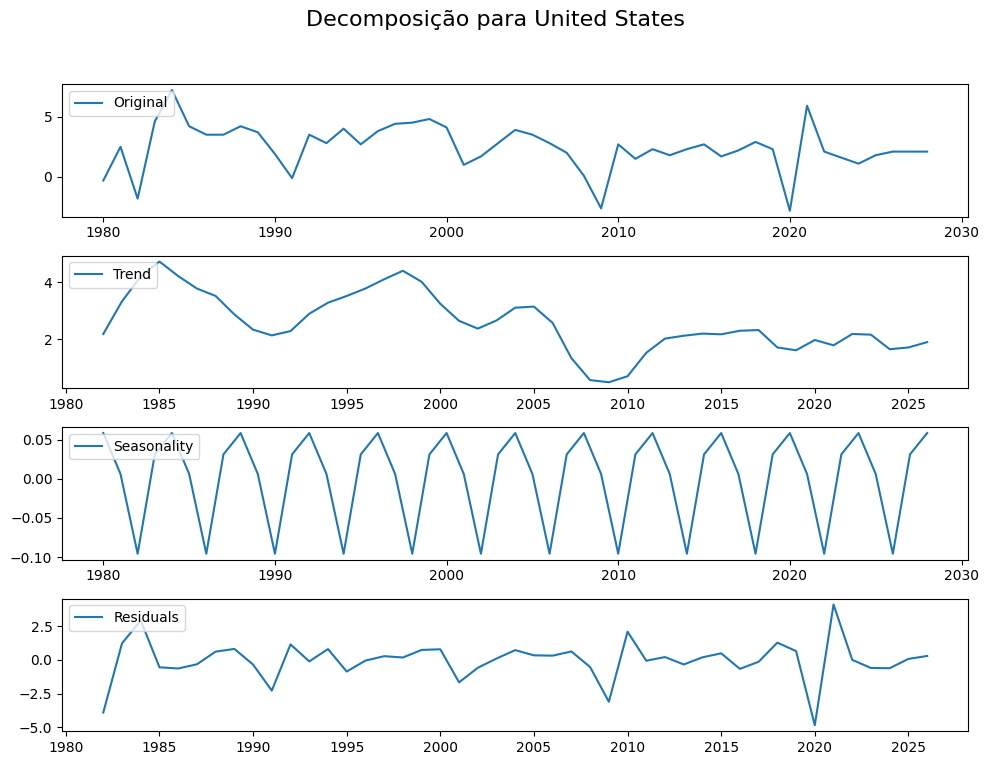

In [61]:


country_name = "United States"  

plt.figure(figsize=(10, 8))
plt.suptitle(f'Decomposição para {country_name}', fontsize=16)

country_series = df_transpose_copy_decompose[country_name]  # select region country column

decomposition = seasonal_decompose(country_series, model='additive', period = 4)
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

plt.subplot(4, 1, 1)
plt.plot(country_series.index, country_series, label='Original')
plt.legend(loc='upper left')

plt.subplot(4, 1, 2)
plt.plot(country_series.index, trend, label='Trend')
plt.legend(loc='upper left')

plt.subplot(4, 1, 3)
plt.plot(country_series.index, seasonal, label='Seasonality')
plt.legend(loc='upper left')

plt.subplot(4, 1, 4)
plt.plot(country_series.index, residual, label='Residuals')
plt.legend(loc='upper left')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  #Adjust title space
plt.show()


Podemos observar que nos anos que antecedem a recessão de 2008 já observa-se o ínicio do decrescimento do GDP, tendo seu vale em 2008 e uma recuperação em 2010 que atinge um patamar de crescimento similar aos anos que antecediam a queda para a recessão. Nota-se também que apesar de ter sofrido pontualmente com a crise sanitária da COVID-19 no ano de 2020 a trend observada para o mesmo período não se compara àquela ocorrida na recessão de 2008, o que nos leva a uma interpretação de que a recessão econômica pode ter sido mais impactante para a economia americana do que a crise sanitária da covid-19. 

#### Decomposição Sazonal para grupos dos países

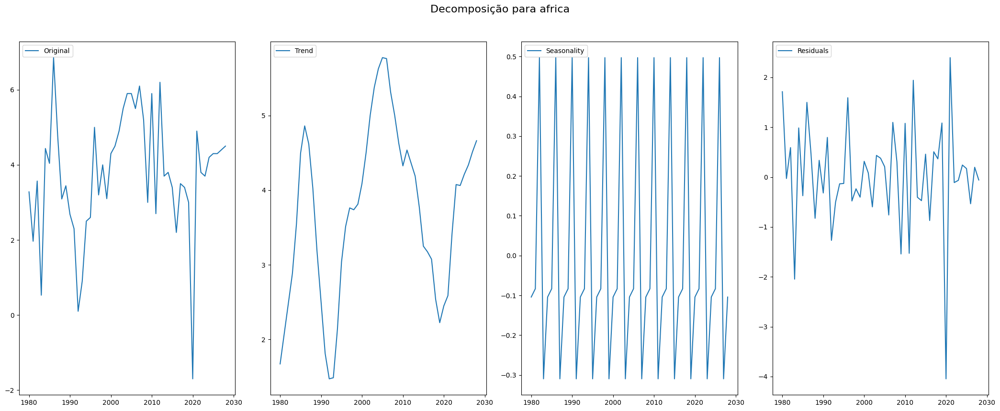

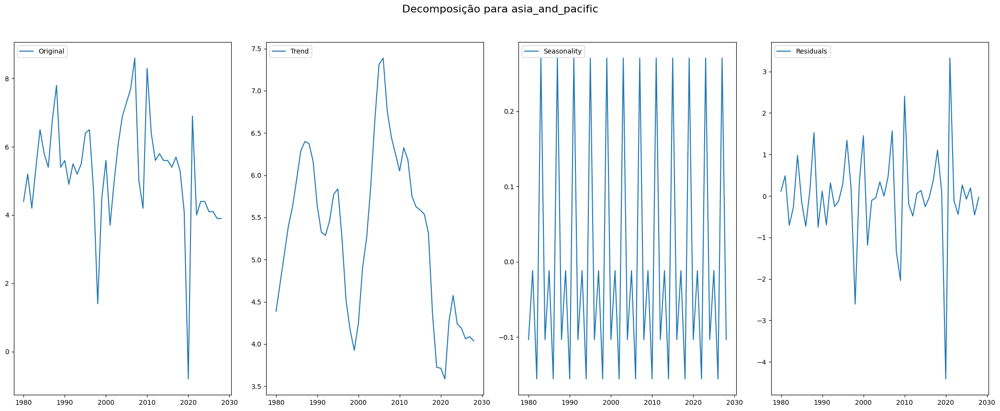

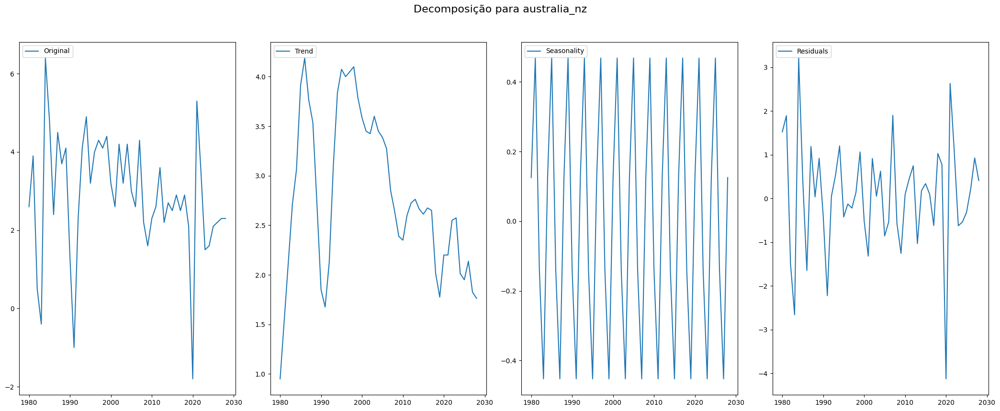

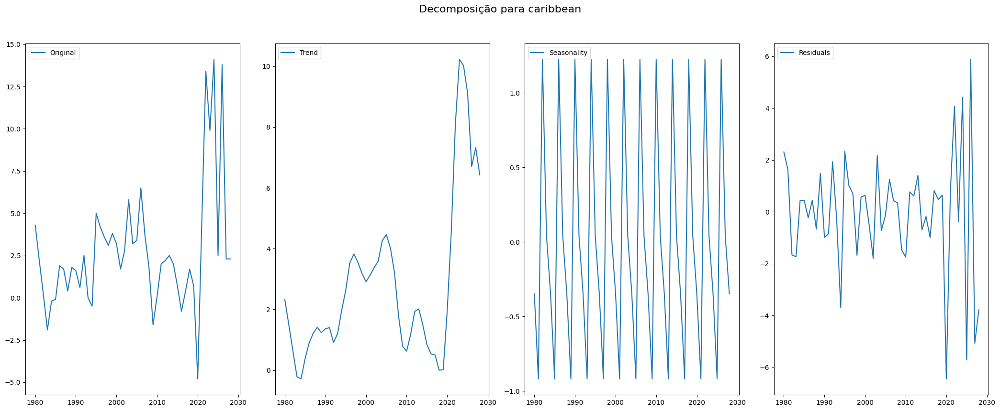

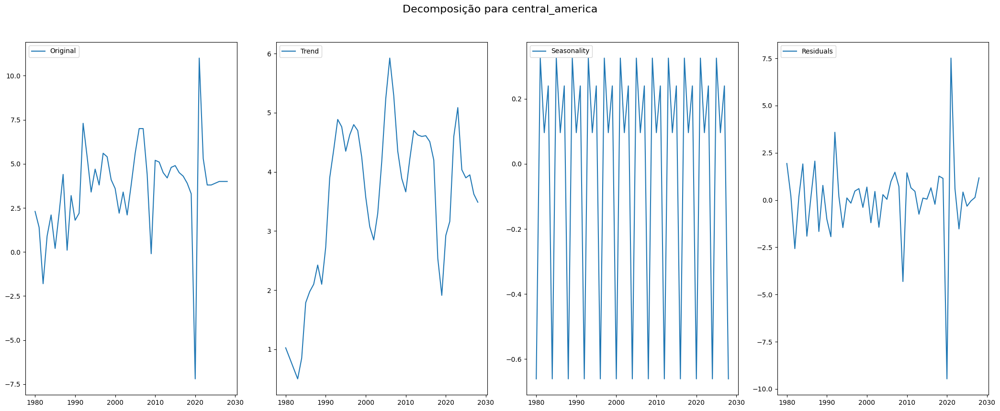

...

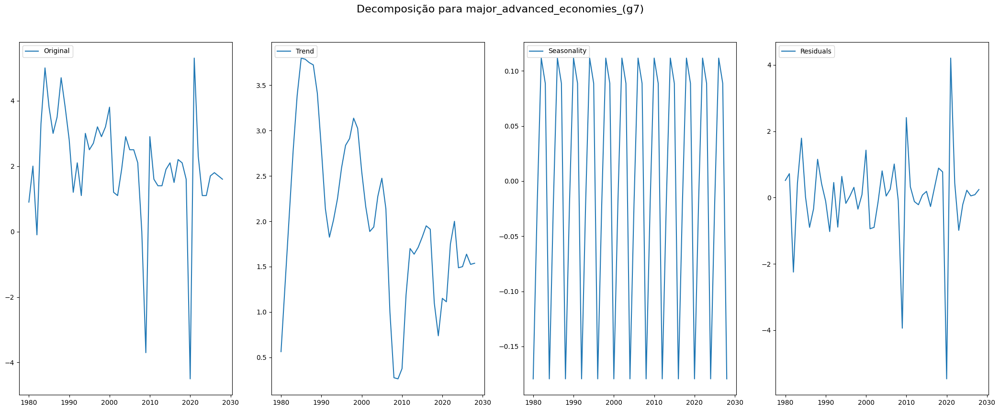

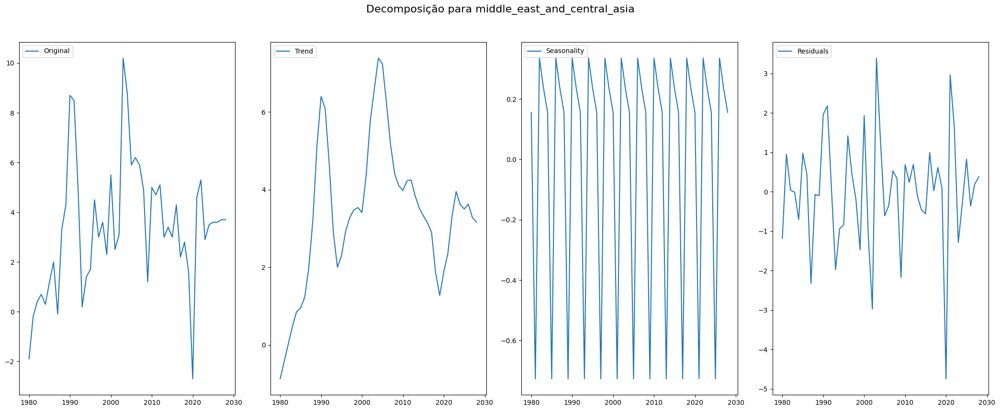

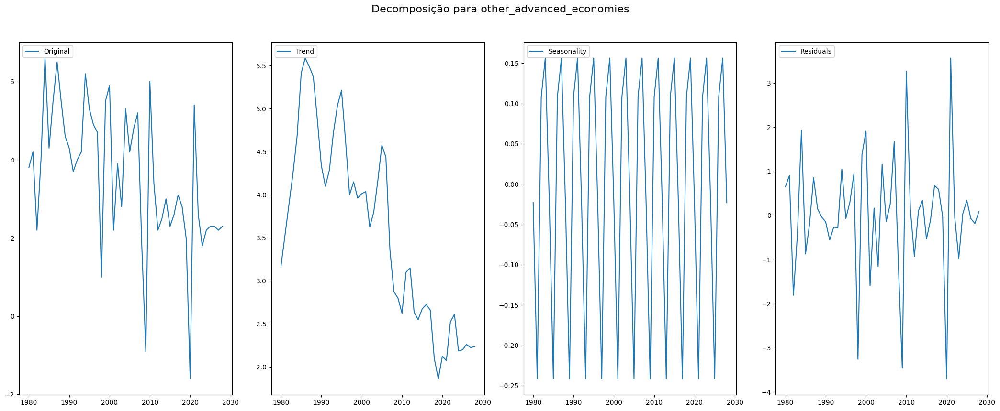

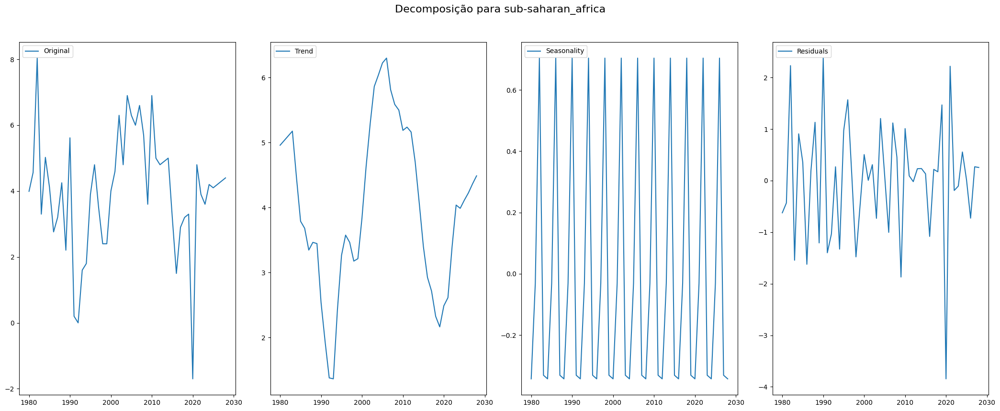

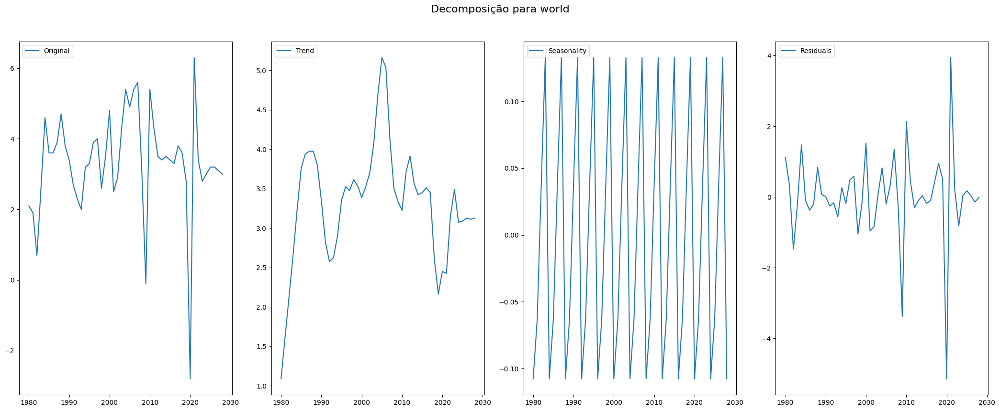

In [59]:

# Loop for decomposing and plot the decomposing graph for every group listed
for group_name, group_countries_list in groups3.items():
    plt.figure(figsize=(21, 9))
    plt.suptitle(f'Decomposição para {group_name}', fontsize=16)

    for country_series_name in group_countries_list:
        country_series = df_transpose_copy_decompose[country_series_name]  # Select the correspondent region column
        decomposition = seasonal_decompose(country_series, model='additive', period = 4)
        trend = decomposition.trend
        seasonal = decomposition.seasonal
        residual = decomposition.resid
        
        index = group_countries_list.index(country_series_name)
        
        plt.subplot(len(group_countries_list), 4, index * 4 + 1)
        plt.plot(country_series.index, country_series, label='Original')
        plt.legend(loc='upper left')
        
        plt.subplot(len(group_countries_list), 4, index * 4 + 2)
        plt.plot(country_series.index, trend, label='Trend')
        plt.legend(loc='upper left')
        
        plt.subplot(len(group_countries_list), 4, index * 4 + 3)
        plt.plot(country_series.index, seasonal, label='Seasonality')
        plt.legend(loc='upper left')
        
        plt.subplot(len(group_countries_list), 4, index * 4 + 4)
        plt.plot(country_series.index, residual, label='Residuals')
        plt.legend(loc='upper left')
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust title space
    plt.show()


Se existe sazonalidade, então, existe uma maneira de se realizar a predição, uma vez que há algum padrão na forma como os dados se comportam.

### Plot de ACF para os países

O teste de autocorrelação (ACF) é uma ferramenta útil para analisar séries temporais. Ele mede a correlação entre os valores de uma série temporal em diferentes pontos no tempo. O gráfico de ACF mostra a autocorrelação para diferentes defasagens (lags) no tempo. Cada barra no gráfico representa a correlação entre os valores da série temporal separados por um determinado número de períodos de tempo. 


O teste de ACF é uma das formas de se identificar padrões sazonais ou ciclos nos dados.
- Se o gráfico de ACF mostrar picos em intervalos regulares, isso pode indicar a presença de sazonalidade nos dados.


O teste de ACF também pode ser usado para determinar se uma série temporal é estacionária ou não.
- Se o gráfico de ACF mostra uma diminuição lenta e gradual das autocorrelações isso pode indicar que a série temporal não é estacionária. 


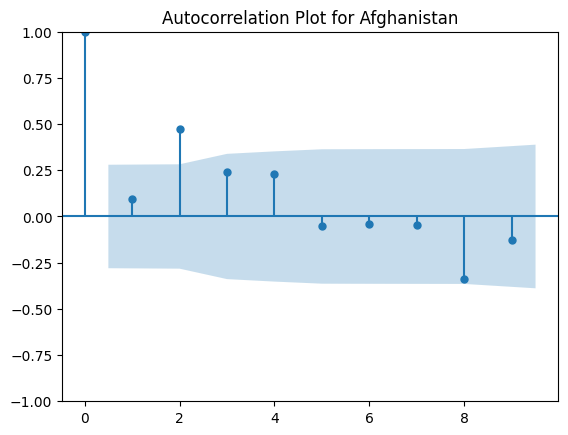

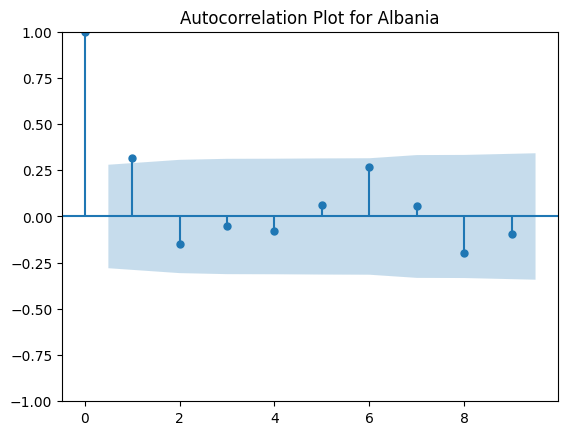

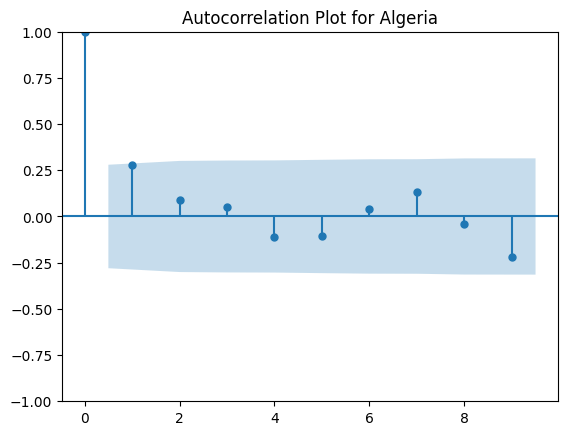

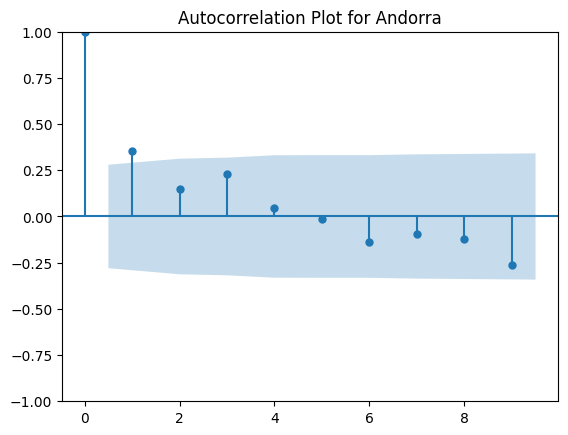

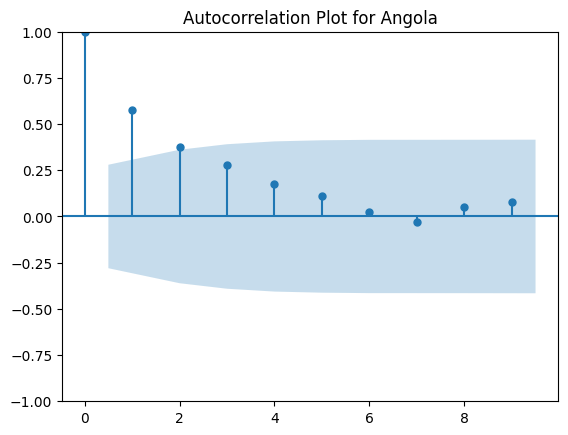

...

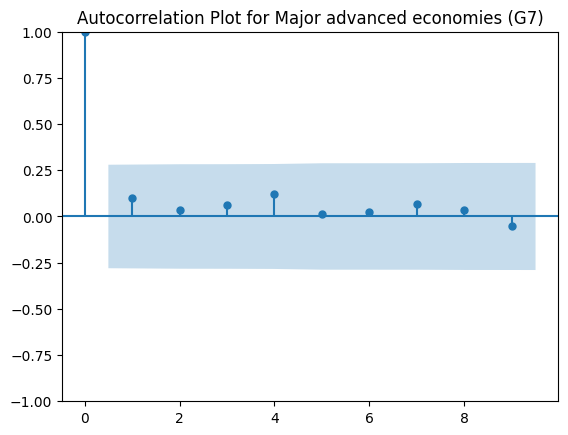

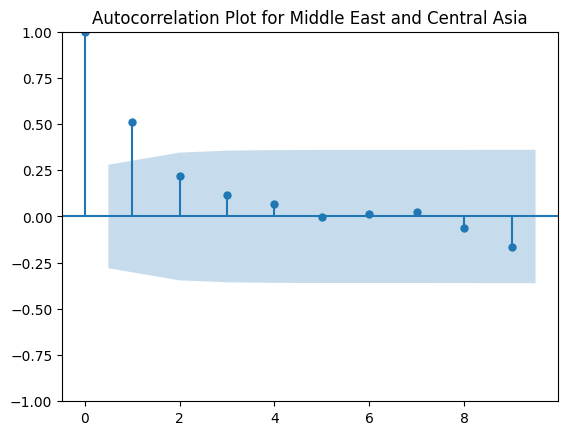

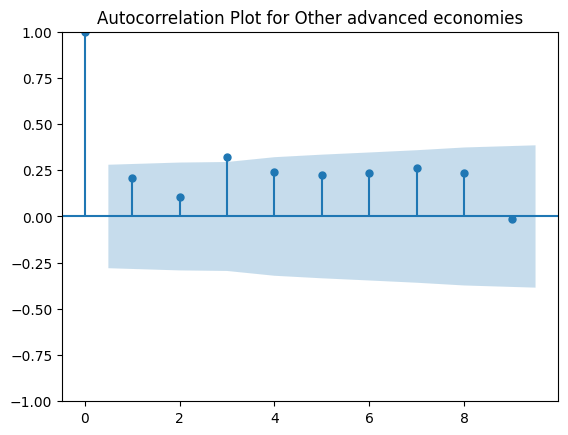

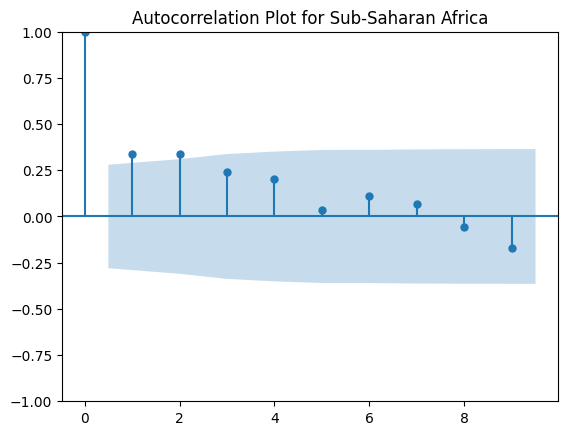

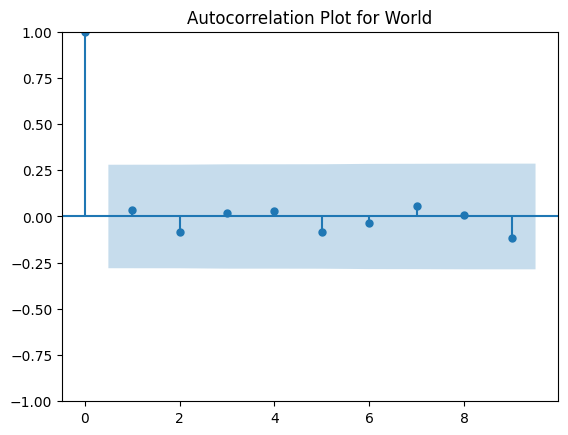

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
for country in df_transpose_copy_diff.columns:
    plot_acf(df_transpose_copy_diff[country], lags=9)
    plt.title(f'Autocorrelation Plot for {country}')
    plt.show()


Observa-se que o teste de ACF é útil para entender a autocorrelação presente nos dados, porém não é uma abordagem direta para determinar a estacionariedade das séries temporais, uma vez que observa-se os padrões de autocorrelação em diferentes defasagens (lags).

Para confirmar a estacionariedade de uma série temporal será utilizado dois testes estatísticos específicos, como o teste Augmented Dickey-Fuller (ADF) e o teste Kwiatkowski-Phillips-Schmidt-Shin (KPSS). Esses testes fornecem uma análise mais formal da estacionariedade, levando em consideração fatores como tendência e sazonalidade.

### Teste ADF para os países

O teste de Dickey-Fuller Aumentado (ADF) é uma ferramenta estatística comum usada para testar a estacionariedade de uma série temporal. A estacionariedade é uma propriedade importante das séries temporais, pois muitos modelos de previsão assumem que a série temporal é estacionária. Se uma série temporal não é estacionária, pode ser necessário transformá-la antes de ajustar um modelo de previsão.

O teste de ADF avalia a hipótese nula de que a série temporal possui uma raiz unitária, o que indica que ela não é estacionária. Se o valor-p do teste for menor que um nível de significância pré-determinado (geralmente 0,05), podemos rejeitar a hipótese nula e concluir que a série temporal é estacionária.

In [ ]:

# Listas para armazenar os resultados
series_estacionarias = []
series_nao_estacionarias = []

# Loop através de todas as colunas do DataFrame
for country_column in df_transpose_copy_diff.columns:
    # Selecionar a série temporal do país atual
    series_to_test = df_transpose_copy_diff[country_column]

    # Calcular o teste ADF
    result = adfuller(series_to_test)
    adf_statistic = result[0]
    p_value = result[1]
    critical_values = result[4]

    # Definir o nível de significância
    significance_level = 0.05

    # Verificar se a série é estacionária com o teste ADF
    if p_value <= significance_level:
        series_estacionarias.append(country_column)
        print(f"A série para {country_column} é estacionária.")
    else:
        series_nao_estacionarias.append(country_column)
        print(f"A série para {country_column} é não estacionária.")

    # Imprimir o resultado do teste ADF
    print(f"ADF Statistic: {adf_statistic}")
    print(f"p-value: {p_value}")
    print("Critical Values:")
    for key, value in critical_values.items():
        print(f"   {key}: {value}")
    print("-------------------")

# Calcular porcentagens
total_series = len(df_transpose_copy_diff.columns)
porcentagem_estacionarias = (len(series_estacionarias) / total_series) * 100
porcentagem_nao_estacionarias = (len(series_nao_estacionarias) / total_series) * 100

# Imprimir porcentagens
print(f"Porcentagem de Séries Estacionárias: {porcentagem_estacionarias:.2f}%")
print(f"Porcentagem de Séries Não Estacionárias: {porcentagem_nao_estacionarias:.2f}%")

# Listas de países
paises_estacionarios = series_estacionarias
paises_nao_estacionarios = series_nao_estacionarias

print("Países Estacionários:", paises_estacionarios)
print("Países Não Estacionários:", paises_nao_estacionarios)


A série para Afghanistan é estacionária.
ADF Statistic: -3.1810979126834207
p-value: 0.02110520997262414
Critical Values:
   1%: -3.5925042342183704
   5%: -2.931549768951162
   10%: -2.60406594375338
-------------------
A série para Albania é não estacionária.
ADF Statistic: -2.1381641595198424
p-value: 0.22944797755259422
Critical Values:
   1%: -3.6155091011809297
   5%: -2.941262357486514
   10%: -2.6091995013850418
-------------------
A série para Algeria é estacionária.
ADF Statistic: -5.713759702832604
p-value: 7.199511075876565e-07
Critical Values:
   1%: -3.5745892596209488
   5%: -2.9239543084490744
   10%: -2.6000391840277777
-------------------
A série para Andorra é estacionária.
ADF Statistic: -4.693783769280701
p-value: 8.644483131212066e-05
Critical Values:
   1%: -3.5745892596209488
   5%: -2.9239543084490744
   10%: -2.6000391840277777
-------------------
A série para Angola é estacionária.
ADF Statistic: -3.5284185901110527
p-value: 0.007286545080543805
Critical Valu

A série para Belarus é estacionária.
ADF Statistic: -2.8959978709539222
p-value: 0.04581537390115763
Critical Values:
   1%: -3.5745892596209488
   5%: -2.9239543084490744
   10%: -2.6000391840277777
-------------------
A série para Belgium é estacionária.
ADF Statistic: -7.920801754349838
p-value: 3.728891784010711e-12
Critical Values:
   1%: -3.5745892596209488
   5%: -2.9239543084490744
   10%: -2.6000391840277777
-------------------
A série para Belize é estacionária.
ADF Statistic: -5.028499609765114
p-value: 1.9484319876073873e-05
Critical Values:
   1%: -3.5745892596209488
   5%: -2.9239543084490744
   10%: -2.6000391840277777
-------------------
A série para Benin é não estacionária.
ADF Statistic: -1.5865994039989655
p-value: 0.4903215073724672
Critical Values:
   1%: -3.5885733964124715
   5%: -2.929885661157025
   10%: -2.6031845661157025
-------------------
A série para Bhutan é não estacionária.
ADF Statistic: -2.376637496880852
p-value: 0.1484391540977581
Critical Values:

Com o teste de ADF podemos observar que o conjunto de dados possui aproximadamente 82% de séries temporais estacionárias e 17.98% de séries não-estacionárias. 

### Teste KPSS

O teste KPSS (Kwiatkowski-Phillips-Schmidt-Shin) é uma ferramenta estatística utilizada para avaliar a estacionariedade em séries temporais. Diferentemente do teste ADF (Augmented Dickey-Fuller), que assume a presença de uma tendência determinística, o teste KPSS opera sob a hipótese nula de que a série é estacionária em torno de uma média constante, enquanto a hipótese alternativa sugere a presença de tendência. O teste KPSS avalia a média da série ao longo do tempo, comparando-a com a média global.



 Ao aplicar o teste KPSS, a série é decomposta em suas componentes de tendência e estacionariedade. Se o valor do teste estiver abaixo de um determinado limiar crítico, aceita-se a hipótese nula de estacionariedade. Por outro lado, se o valor do teste estiver acima desse limiar, rejeita-se a hipótese nula, sugerindo que a série possui uma tendência significativa. Em alguns casos se a série tiver tendência, o teste pode resultar em erros, especialmente se houver interpolações insuficientes.

O código a seguir realiza uma análise comparativa da estacionariedade de séries temporais usando os testes ADF (Augmented Dickey-Fuller) e KPSS (Kwiatkowski-Phillips-Schmidt-Shin). 

In [ ]:

# Lists to store the results
series_estacionarias_adf = []
series_nao_estacionarias_adf = []
series_estacionarias_kpss = []
series_nao_estacionarias_kpss = []
# List to store countries with errors
paises_com_erro = []
# Loop through all columns of the DataFrame
for country_column in df_transpose_copy_diff.columns:
    # Select the time series of the current country
    series_to_test = df_transpose_copy_diff[country_column]

    # Calculate the ADF test
    result_adf = adfuller(series_to_test)
    adf_statistic = result_adf[0]
    p_value_adf = result_adf[1]
    critical_values_adf = result_adf[4]

    # Calculate the KPSS test
    with warnings.catch_warnings():
        warnings.filterwarnings("error", category=InterpolationWarning)
        try:    
    # Calculate the KPSS test
            result_kpss = kpss(series_to_test)
            kpss_statistic = result_kpss[0]
            p_value_kpss = result_kpss[1]
            critical_values_kpss = result_kpss[3]
        except InterpolationWarning:
            paises_com_erro.append(country_column)
            #continue

    # Set the significance level
    significance_level = 0.05
    # Check if the series is stationary with the ADF and KPSS tests
    if p_value_adf <= significance_level:
        series_estacionarias_adf.append(country_column)
        #print(f" Método ADF: A série para {country_column} é estacionária.")
    else:
        series_nao_estacionarias_adf.append(country_column)
        #print(f"Método ADF: A série para {country_column} é não estacionária.")
    # Check if the series is stationary with the KPSS test
    if p_value_kpss >= significance_level:
        series_estacionarias_kpss.append(country_column)
        #print(f"Método KPSS: A série para {country_column} é estacionária.")
    else:
        series_nao_estacionarias_kpss.append(country_column)
        #print(f"Método KPSS: A série para {country_column} é não estacionária.")
# Print countries with KPSS test errors
print("Países com erro no teste KPSS:")
print(paises_com_erro)
# Calculate percentages
total_series = len(df_transpose_copy_diff.columns)
porcentagem_estacionarias_adf = (len(series_estacionarias_adf) / total_series) * 100
porcentagem_nao_estacionarias_adf = (len(series_nao_estacionarias_adf) / total_series) * 100
porcentagem_estacionarias_kpss = (len(series_estacionarias_kpss) / total_series) * 100
porcentagem_nao_estacionarias_kpss = (len(series_nao_estacionarias_kpss) / total_series) * 100

# Print percentages
print(f"Porcentagem de Séries Estacionárias ADF: {porcentagem_estacionarias_adf:.2f}%")
print(f"Porcentagem de Séries Não Estacionárias ADF: {porcentagem_nao_estacionarias_adf:.2f}%")
print(f"Porcentagem de Séries Estacionárias KPSS: {porcentagem_estacionarias_kpss:.2f}%")
print(f"Porcentagem de Séries Não Estacionárias KPSS: {porcentagem_nao_estacionarias_kpss:.2f}%")

# Convert lists to sets to remove duplicates
set_estacionarias_adf = set(series_estacionarias_adf)
set_nao_estacionarias_adf = set(series_nao_estacionarias_adf)
set_estacionarias_kpss = set(series_estacionarias_kpss)
set_nao_estacionarias_kpss = set(series_nao_estacionarias_kpss)
# Check for common elements in sets
elementos_comuns_adf = set_estacionarias_adf & set_nao_estacionarias_adf
elementos_comuns_kpss = set_estacionarias_kpss & set_nao_estacionarias_kpss
elementos_comuns_adf_kpss_estacionarias = set_estacionarias_adf & set_estacionarias_kpss
elementos_comuns_adf_kpss_nao_estacionarias = set_nao_estacionarias_adf & set_nao_estacionarias_kpss
# Test ADF method
if len(elementos_comuns_adf) == 0:
    print("Não há elementos em comum entre as séries estacionárias e não estacionárias no método ADF.")
else:
    print("Os seguintes elementos estão presentes tanto nas séries estacionárias quanto nas não estacionárias:")
    print(elementos_comuns_adf)
# Test KPSS method
if len(elementos_comuns_kpss) == 0:
    print("Não há elementos em comum entre as séries estacionárias e não estacionárias no método KPSS.")
else:
    print("Os seguintes elementos estão presentes tanto nas séries estacionárias quanto nas não estacionárias:")
    print(elementos_comuns_kpss)
# Test between the two methods for stationary series
if len(elementos_comuns_adf_kpss_estacionarias) == 0:
    print("Não há elementos em comum entre as séries estacionárias e não estacionárias no método KPSS e ADF.")
else:
    print("Os seguintes elementos estão presentes tanto no método ADF quanto KPSS para séries estacionárias. ")
    print(elementos_comuns_adf_kpss_estacionarias)
# Test between the two methods for non-stationary series
if len(elementos_comuns_adf_kpss_nao_estacionarias) == 0:
    print("Não há elementos em comum entre as séries não estacionárias e não estacionárias no método KPSS e ADF.")
else:
    print("Os seguintes elementos estão presentes tanto no método ADF quanto KPSS para séries não estacionárias. ")
    print(elementos_comuns_adf_kpss_nao_estacionarias)

# Find series stationary by ADF method but non-stationary by KPSS method
series_estacionarias_adf_nao_estacionarias_kpss = list(set(series_estacionarias_adf) - set(series_estacionarias_kpss))
series_nao_estacionarias_kpss_estacionarias_adf = list(set(series_nao_estacionarias_kpss) - set(series_nao_estacionarias_adf))

# Check series that are stationary by ADF method but non-stationary by KPSS method
if len(series_estacionarias_adf_nao_estacionarias_kpss) == 0:
    print("Não há séries que são estacionárias pelo método ADF e não estacionárias pelo método KPSS.")
else:
    print("As seguintes séries são estacionárias pelo método ADF e não estacionárias pelo método KPSS:")
    print(series_estacionarias_adf_nao_estacionarias_kpss)

# Check series that are non-stationary by KPSS method but stationary by ADF method
if len(series_nao_estacionarias_kpss_estacionarias_adf) == 0:
    print("Não há séries que são não estacionárias pelo método KPSS e estacionárias pelo método ADF.")
else:
    print("As seguintes séries são não estacionárias pelo método KPSS e estacionárias pelo método ADF:")
    print(series_nao_estacionarias_kpss_estacionarias_adf)

# Calculate the percentage of series with differences compared to the total series
porcentagem_diferencas = (len(series_estacionarias_adf_nao_estacionarias_kpss) + len(series_nao_estacionarias_kpss_estacionarias_adf)) / total_series * 100

# Print the percentage of series with differences
print(f"Porcentagem de Séries com Diferenças entre Métodos ADF e KPSS: {porcentagem_diferencas:.2f}%")

# Create lists of countries with errors that are also stationary and non-stationary by the ADF method
paises_com_erro_estacionarias_adf = list(set(paises_com_erro) & set(series_estacionarias_adf))
paises_com_erro_nao_estacionarias_adf = list(set(paises_com_erro) & set(series_nao_estacionarias_adf))

# Calculate the corresponding percentage of each list relative to the total countries with errors
porcentagem_paises_com_erro_estacionarias_adf = (len(paises_com_erro_estacionarias_adf) / len(paises_com_erro)) * 100
porcentagem_paises_com_erro_nao_estacionarias_adf = (len(paises_com_erro_nao_estacionarias_adf) / len(paises_com_erro)) * 100

# Print the corresponding percentages
print(f"Porcentagem de Países com Erro que também são Estacionárias pelo Método ADF: {porcentagem_paises_com_erro_estacionarias_adf:.2f}%")
print(f"Porcentagem de Países com Erro que também são Não Estacionárias pelo Método ADF: {porcentagem_paises_com_erro_nao_estacionarias_adf:.2f}%")


Países com erro no teste KPSS:
['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba', 'Austria', 'Azerbaijan', 'The Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Bolivia', 'Brazil', 'Brunei Darussalam', 'Bulgaria', 'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada', 'Central African Republic', 'Chad', 'Colombia', 'Comoros', 'Republic of Congo', 'Costa Rica', 'Croatia', 'Czech Republic', 'Denmark', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Germany', 'Ghana', 'Greece', 'Grenada', 'Haiti', 'Honduras', 'Hong Kong SAR', 'Hungary', 'Iceland', 'India', 'Indonesia', 'Iran', 'Iraq', 'Ireland', 'Israel', 'Jamaica', 'Japan', 'Jordan', 'Kazakhstan', 'Republic of Korea', 'Kosovo', 'Kuwait', 'Lao P.D.R.', 'Latvia', 'Liberia', 'Macao SAR', 'Malawi', 'Mali', 'Malta', 'Marshall 

Os países que apresentam erro no teste KPSS pode ser devido as séries temporais desses países terem características que não se encaixam bem na suposição do teste de que não há tendência. Isso pode ser devido a flutuações de dados, sazonalidades ou tendências presentes nas séries temporais desses países.
Dessa forma, a detecção desse erro é importante para indicar que o resultado do teste pode não ser confiável para essas séries e que outras abordagens ou métodos de análise podem ser necessários.

Dessa maneira, iremos escolher o teste ADF para utilizar em alguns modelos a serem aplicados na seção V3 dos notebooks de modelagem.